In [3]:
#import libraries
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer



In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# Load dataset
df = pd.read_csv("/content/drive/MyDrive/project/UML_Project/CC GENERAL.csv")
df.head()


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [6]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [7]:
df.isna().sum()

,0
CUST_ID,0
BALANCE,0
BALANCE_FREQUENCY,0
PURCHASES,0
ONEOFF_PURCHASES,0
INSTALLMENTS_PURCHASES,0
CASH_ADVANCE,0
PURCHASES_FREQUENCY,0
ONEOFF_PURCHASES_FREQUENCY,0
PURCHASES_INSTALLMENTS_FREQUENCY,0


In [8]:
#List Null Columns
null_columns = df.columns[df.isnull().any()].tolist()
null_columns

['CREDIT_LIMIT', 'MINIMUM_PAYMENTS']

In [9]:
#Perform Imputation
imputer = KNNImputer()
df_imput = pd.DataFrame(imputer.fit_transform(df[null_columns]), columns=null_columns)
df = df.fillna(df_imput)

In [10]:
df.isna().sum()

,0
CUST_ID,0
BALANCE,0
BALANCE_FREQUENCY,0
PURCHASES,0
ONEOFF_PURCHASES,0
INSTALLMENTS_PURCHASES,0
CASH_ADVANCE,0
PURCHASES_FREQUENCY,0
ONEOFF_PURCHASES_FREQUENCY,0
PURCHASES_INSTALLMENTS_FREQUENCY,0


In [11]:
# Drop irrelevant columns
df = df.drop(['CUST_ID'], axis=1)

In [12]:
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,1215.951453,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


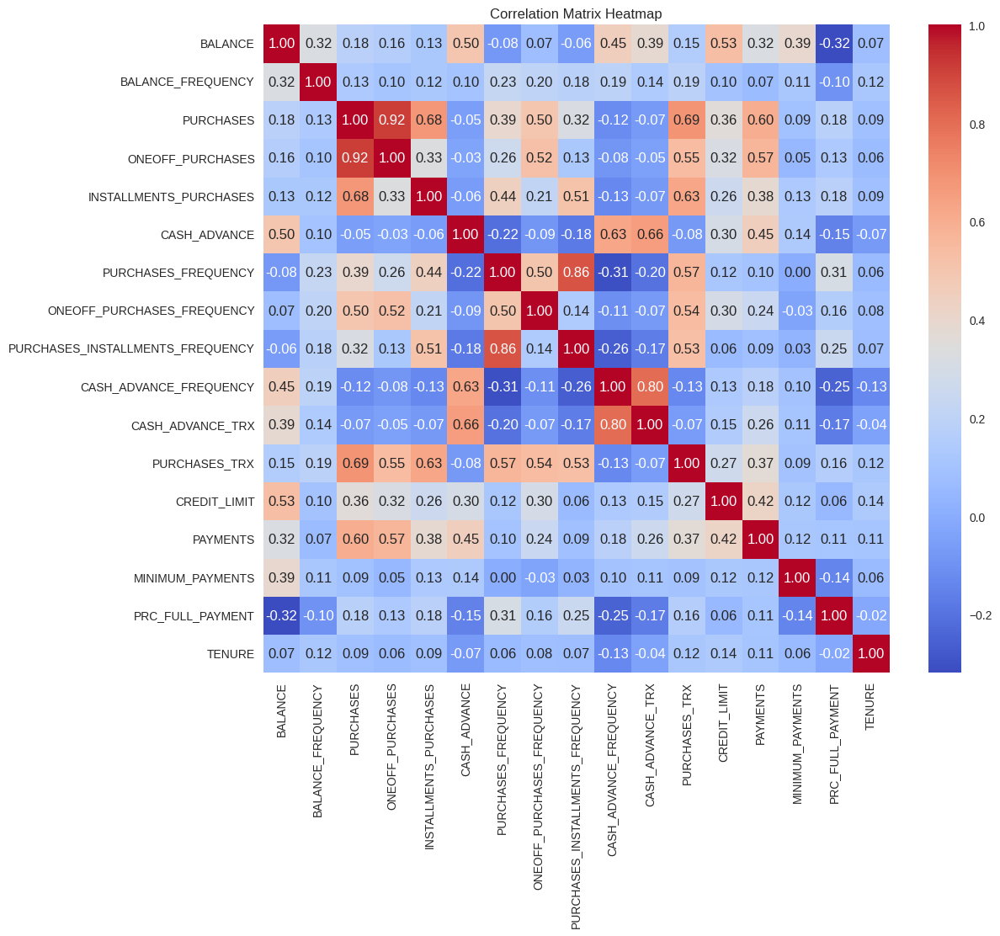

In [13]:


# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

In [14]:
#Scaling Dataset with Standard Scaler
X = pd.DataFrame(StandardScaler().fit_transform(df))

In [15]:
X.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-0.731989,-0.249434,-0.424900,-0.356934,-0.349079,-0.466786,-0.806490,-0.678661,-0.707313,-0.675349,-0.476070,-0.511333,-0.960383,-0.528979,-0.311729,-0.525551,0.36068
1,0.786961,0.134325,-0.469552,-0.356934,-0.454576,2.605605,-1.221758,-0.678661,-0.916995,0.573963,0.110074,-0.591796,0.688676,0.818642,0.087047,0.234227,0.36068
2,0.447135,0.518084,-0.107668,0.108889,-0.454576,-0.466786,1.269843,2.673451,-0.916995,-0.675349,-0.476070,-0.109020,0.826098,-0.383805,-0.103210,-0.525551,0.36068
3,0.049099,-1.016953,0.232058,0.546189,-0.454576,-0.368653,-1.014125,-0.399319,-0.916995,-0.258913,-0.329534,-0.551565,0.826098,-0.598688,0.148440,-0.525551,0.36068
4,-0.358775,0.518084,-0.462063,-0.347294,-0.454576,-0.466786,-1.014125,-0.399319,-0.916995,-0.675349,-0.476070,-0.551565,-0.905414,-0.364368,-0.266722,-0.525551,0.36068


In [16]:
# Transform into Array
X = np.asarray(X)

# Applying PCA
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

In [17]:
X

array([[-1.68188049, -1.07717876],
       [-1.13918766,  2.50597029],
       [ 0.9698301 , -0.38319725],
       ...,
       [-0.92564663, -1.81129038],
       [-2.336381  , -0.65895773],
       [-0.5562616 , -0.40055803]])

Text(0, 0.5, 'Distortion Scores\n')

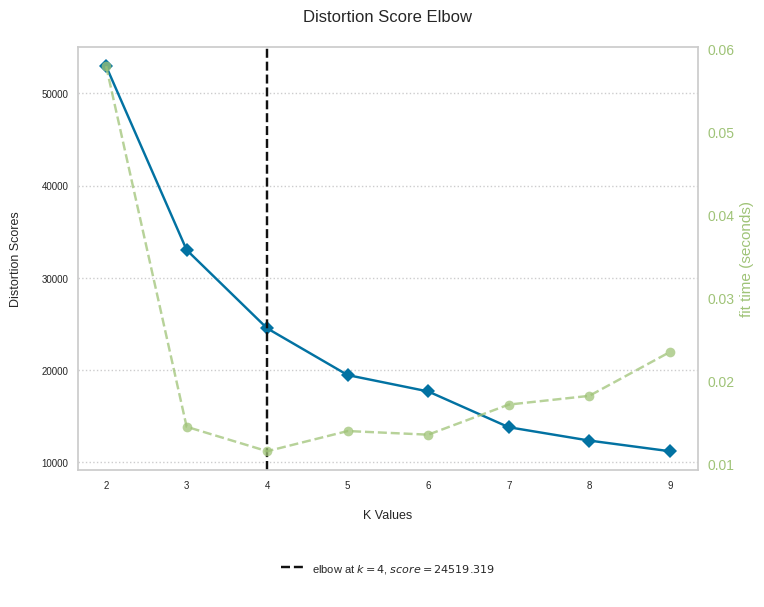

In [18]:
 #Elbow Score
elbow_score = KElbowVisualizer(KMeans(random_state=32, max_iter=500), k=(2, 10))
elbow_score.fit(X)
elbow_score.finalize()
elbow_score.ax.set_title('Distortion Score Elbow\n')
elbow_score.ax.tick_params(labelsize=7)
for text in elbow_score.ax.legend_.texts:
        text.set_fontsize(9)
for spine in elbow_score.ax.spines.values():
        spine.set_color('None')
elbow_score.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
elbow_score.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
elbow_score.ax.grid(axis='x', alpha=0)
elbow_score.ax.set_xlabel('\nK Values', fontsize=9)
elbow_score.ax.set_ylabel('Distortion Scores\n', fontsize=9)

Text(0, 0.5, 'Calinski-Harabasz Score\n')

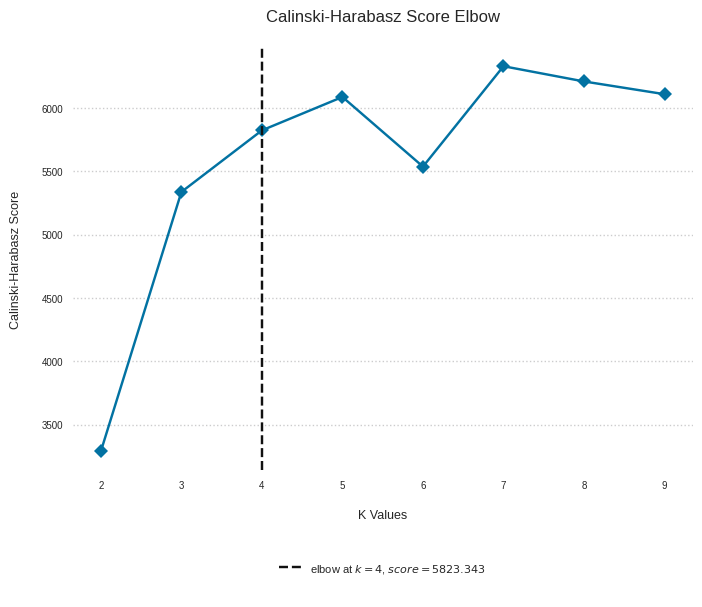

In [19]:
#Elbow Score (Calinski-Harabasz Index)
elbow_score_ch = KElbowVisualizer(KMeans(random_state=32, max_iter=500), k=(2, 10), metric='calinski_harabasz', timings=False)
elbow_score_ch.fit(X)
elbow_score_ch.finalize()
elbow_score_ch.ax.set_title('Calinski-Harabasz Score Elbow\n')
elbow_score_ch.ax.tick_params(labelsize=7)
for text in elbow_score_ch.ax.legend_.texts:
    text.set_fontsize(9)
for spine in elbow_score_ch.ax.spines.values():
    spine.set_color('None')
elbow_score_ch.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
elbow_score_ch.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
elbow_score_ch.ax.grid(axis='x', alpha=0)
elbow_score_ch.ax.set_xlabel('\nK Values', fontsize=9)
elbow_score_ch.ax.set_ylabel('Calinski-Harabasz Score\n', fontsize=9)



In [20]:
#Implementing K-Means
kmeans = KMeans(n_clusters=4, random_state=32, max_iter=500)
y_kmeans = kmeans.fit_predict(X)

In [21]:
#Evaluate Clustering Quality Function
def evaluate_clustering(X, y):
    db_index = round(davies_bouldin_score(X, y), 3)
    s_score = round(silhouette_score(X, y), 3)
    ch_index = round(calinski_harabasz_score(X, y), 3)
    print('Evaluate Clustering Quality:\n')
    print('Davies-Bouldin Index: ', db_index)
    print('Silhouette Score: ', s_score)
    print('Calinski Harabasz Index: ', ch_index)
    return db_index, s_score, ch_index

#Evaluate K-Means Cluster Quality
db_kmeans, ss_kmeans, ch_kmeans = evaluate_clustering(X, y_kmeans)

Evaluate Clustering Quality:

Davies-Bouldin Index:  0.8
Silhouette Score:  0.408
Calinski Harabasz Index:  5823.343


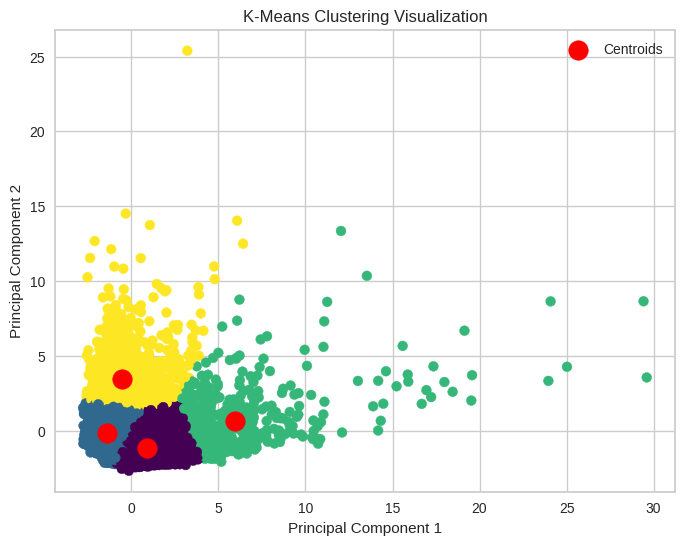

In [22]:
# Visualize K-Means Clustering
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='red', label='Centroids')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering Visualization')
plt.legend()
plt.show()



In [23]:
#Implementing DBSCAN
dbscan = DBSCAN(eps=2, min_samples=4)
y_dbscan = dbscan.fit_predict(X)

In [24]:
# Evaluate DBSCAN Cluster Quality
db_dbscan, ss_dbscan, ch_dbscan = evaluate_clustering(X, y_dbscan)

Evaluate Clustering Quality:

Davies-Bouldin Index:  1.287
Silhouette Score:  0.803
Calinski Harabasz Index:  685.302


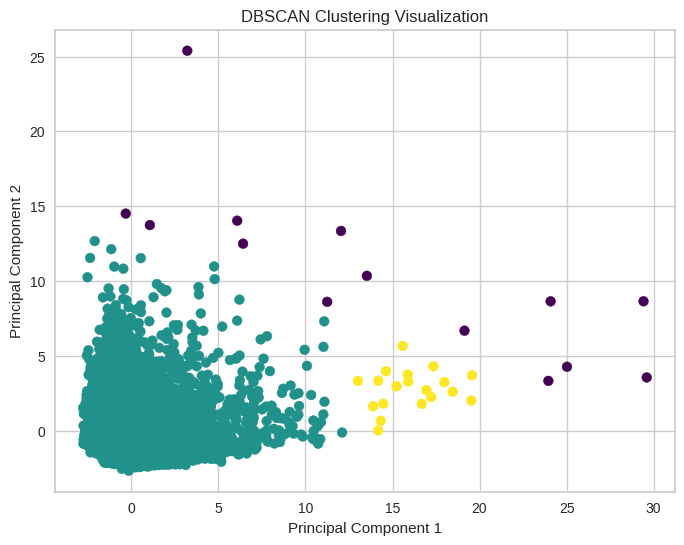

In [25]:
# Visualize DBSCAN Clustering
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y_dbscan, s=50, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clustering Visualization')
plt.show()

In [26]:
#Implementing Hierarchical Clustering
agg_cluster = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
y_agg_cluster = agg_cluster.fit_predict(X)

In [27]:
# Evaluate Heirarchical Cluster Quality
db_agg, ss_agg, ch_agg = evaluate_clustering(X, y_agg_cluster)

Evaluate Clustering Quality:

Davies-Bouldin Index:  0.855
Silhouette Score:  0.388
Calinski Harabasz Index:  4936.96


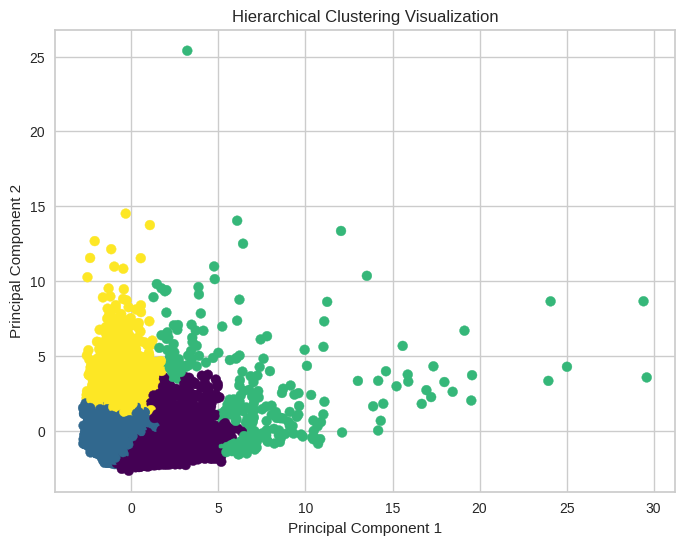

In [28]:
# Visualize Hierarchical Clustering
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y_agg_cluster, s=50, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Hierarchical Clustering Visualization')
plt.show()

In [29]:
#Implementing Spectral Clustering
spectral_cluster = SpectralClustering(n_clusters=4, assign_labels='kmeans', random_state=0)
y_spectral_cluster = spectral_cluster.fit_predict(X)

#Evaluate Spectral Cluster Quality
db_spectral, ss_spectral, ch_spectral = evaluate_clustering(X, y_spectral_cluster)




Evaluate Clustering Quality:

Davies-Bouldin Index:  11.334
Silhouette Score:  0.004
Calinski Harabasz Index:  190.856


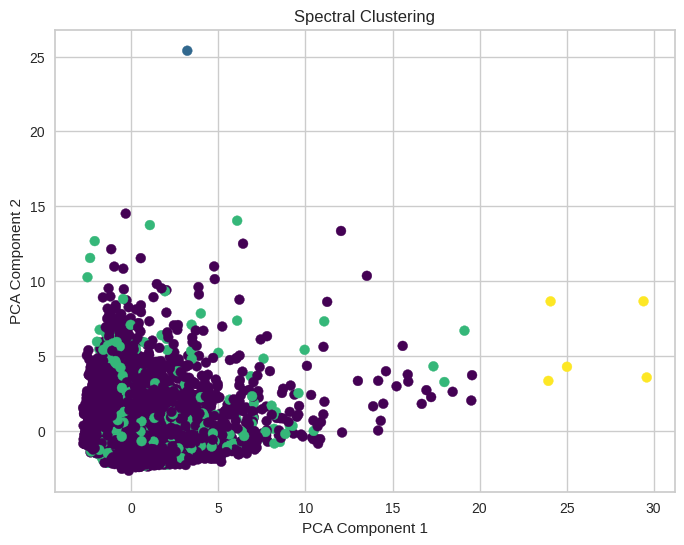

In [30]:
# Visualize the results of Spectral Clustering
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y_spectral_cluster, cmap='viridis', s=50)
plt.title('Spectral Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()







In [31]:
# Create a table to compare the evaluation metrics of different clustering algorithms
data = {
    'Algorithm': ['K-Means', 'DBSCAN', 'Hierarchical', 'Spectral'],
    'Davies-Bouldin Index': [db_kmeans, db_dbscan, db_agg, db_spectral],
    'Silhouette Score': [ss_kmeans, ss_dbscan, ss_agg, ss_spectral],
    'Calinski-Harabasz Index': [ch_kmeans, ch_dbscan, ch_agg, ch_spectral]
}

comparison_df = pd.DataFrame(data)
comparison_df

,Algorithm,Davies-Bouldin Index,Silhouette Score,Calinski-Harabasz Index
0,K-Means,0.800,0.408,5823.343
1,DBSCAN,1.287,0.803,685.302
2,Hierarchical,0.855,0.388,4936.960
3,Spectral,11.334,0.004,190.856


In [32]:
# Add K-Means Prediction to Data Frame
df['cluster_result'] = y_kmeans+1
df['cluster_result'] = 'Cluster '+df['cluster_result'].astype(str)

#Calculationg Overall Mean from Current Data Frame
df_profile_overall = pd.DataFrame()
df_profile_overall['Overall'] = df.describe().loc[['mean']].T

#Summarize Mean of Each Cluster
df_cluster_summary = df.groupby('cluster_result').describe().T.reset_index().rename(columns={'level_0': 'Column Name', 'level_1': 'Metrics'})
df_cluster_summary = df_cluster_summary[df_cluster_summary['Metrics'] == 'mean'].set_index('Column Name')

#Combining Both Data Frame
print('Summary of Each Cluster :')
df_profile = df_cluster_summary.join(df_profile_overall).reset_index()
df_profile.style.background_gradient(cmap='YlOrBr')


Summary of Each Cluster :


,Column Name,Metrics,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Overall
0,BALANCE,mean,814.406180,1028.913422,3404.277246,4529.658912,1564.474828
1,BALANCE_FREQUENCY,mean,0.917771,0.800633,0.988518,0.964222,0.877271
2,PURCHASES,mean,1224.752724,219.106636,6866.239428,465.488779,1003.204834
3,ONEOFF_PURCHASES,mean,615.489080,155.453341,4495.247515,302.444841,592.437371
4,INSTALLMENTS_PURCHASES,mean,609.466137,63.984949,2372.175345,163.144565,411.067645
5,CASH_ADVANCE,mean,147.839231,625.060377,771.262149,4432.805957,978.871112
6,PURCHASES_FREQUENCY,mean,0.858322,0.185533,0.954802,0.267226,0.490351
7,ONEOFF_PURCHASES_FREQUENCY,mean,0.299198,0.073954,0.727673,0.130512,0.202458
8,PURCHASES_INSTALLMENTS_FREQUENCY,mean,0.671196,0.106485,0.808810,0.166994,0.364437
9,CASH_ADVANCE_FREQUENCY,mean,0.030657,0.124503,0.084630,0.472418,0.135144


Based on the table above, it can be concluded that each cluster has the following characteristics:

**Cluster 1 - Full Payers Users:** These customers have high balances, frequent transactions, and excellent repayment history, making them highly reliable users.<br>
**Cluster 2 - Starter/Student Users:** Customers in this cluster have low balances and credit limits, indicating minimal credit usage, possibly due to inexperience or cautiousness.<br>
**Cluster 3 - Installment Users:** Focus on high installment purchases with infrequent one-off transactions and cash advances.<br>
**Cluster 4 - Cash Advance Users:** Primarily use credit cards for withdrawing cash, exhibiting high balance changes and limited installment purchases.


In [33]:
import shap

  0%|          | 0/100 [00:00<?, ?it/s]

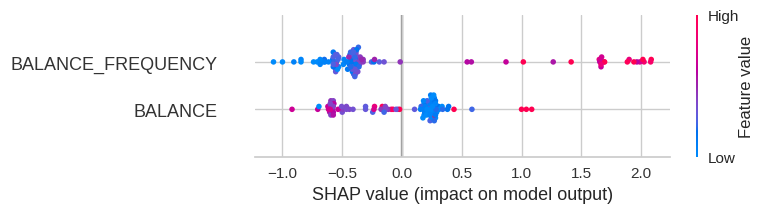

In [34]:
explainer = shap.KernelExplainer(kmeans.predict, X[:100])
shap_values = explainer.shap_values(X[:100])
shap.summary_plot(shap_values, X[:100], feature_names=df.columns)


In [35]:
!pip install lime
import lime
import lime.lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=9e2528fc956aa32a43dbfbbd2416f4c6b3012289edd511187ebab497e1eb9de9
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [40]:
import random

random_instance_indices = random.sample(range(len(X)), 10)
feature_names = df.columns.tolist()

def kmeans_predict_proba(data):

    # Calculate distances to cluster centers
    distances = kmeans.transform(data)

    # Convert distances to similarity scores
    similarities = 1 / (distances + 1e-8)

    # Normalize to get probability-like values
    probabilities = similarities / np.sum(similarities, axis=1, keepdims=True)

    return probabilities


# Define the LIME explainer with standardized data
explainer = lime.lime_tabular.LimeTabularExplainer(
    X,
    feature_names=df.columns,
    class_names=['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'],
    discretize_continuous=True
)

# Explain a random sample of data points
for instance_index in random.sample(range(len(X)), 10):
    print(f"\nExplanation for data point {instance_index + 1}")
    explanation = explainer.explain_instance(
        X[instance_index],
        kmeans_predict_proba,
        num_features=len(df.columns),
        top_labels=4
    )
    explanation.show_in_notebook(show_table=True)


Explanation for data point 2492



Explanation for data point 1010



Explanation for data point 8541



Explanation for data point 824



Explanation for data point 1878



Explanation for data point 1346



Explanation for data point 6736



Explanation for data point 3848



Explanation for data point 700



Explanation for data point 8658
